In [33]:
import gower
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import importlib
import seaborn as sns
from sklearn.metrics.cluster import contingency_matrix
from sklearn.metrics import rand_score, adjusted_rand_score

In [34]:
## import custom scripts
import preprocessing
import autoencored_detection
import isolation_forest_detection
import lof_detection
import knn_detection
import dbscan_detection
import pca_detection
import utils

importlib.reload(utils)
importlib.reload(lof_detection)
importlib.reload(autoencored_detection)
importlib.reload(preprocessing)
importlib.reload(isolation_forest_detection)
importlib.reload(knn_detection)
importlib.reload(dbscan_detection)
importlib.reload(pca_detection)

<module 'pca_detection' from '/home/ronin/Dev/notebooks/machinelearningformodeling/unsupervised/project/pca_detection.py'>

In [3]:
pca_indices = pca_detection.main()
pd.DataFrame(pca_indices).value_counts()

PCA: explained variation per principal component: [0.55993 0.27381 0.06283 0.02981 0.02188 0.01664 0.01021 0.00602]


 0    6829
-1     371
Name: count, dtype: int64

In [4]:
dbscan_indices = dbscan_detection.main()
pd.DataFrame(dbscan_indices).value_counts()

 0    6862
-1     338
Name: count, dtype: int64

In [5]:
# Importing the dataset
lof_indices = lof_detection.main()
pd.DataFrame(lof_indices).value_counts()

 0    6840
-1     360
Name: count, dtype: int64

In [6]:
autoencored_indices = np.array(autoencored_detection.main())
pd.DataFrame(autoencored_indices).value_counts()

Epoch [1/50], Loss: 0.1344, LR: 0.01
Epoch [11/50], Loss: 0.0227, LR: 0.01
Epoch [21/50], Loss: 0.0161, LR: 0.01
Epoch [31/50], Loss: 0.0044, LR: 0.005
Epoch [41/50], Loss: 0.0046, LR: 0.005
Training complete
treshold was set to: 0.1012
percentage of outliers was set to:  4.04%


 0    6909
-1     291
Name: count, dtype: int64

In [7]:
isolation_forest_indices = pd.DataFrame(isolation_forest_detection.main()).replace({1:0}).to_numpy()[:,0]
pd.DataFrame(isolation_forest_indices).value_counts()

 0    6840
-1     360
Name: count, dtype: int64

In [8]:
knn_indices = np.array(knn_detection.main())
pd.DataFrame(knn_indices).value_counts()

knee = 0.05163099989295006


 0    6882
-1     318
Name: count, dtype: int64

In [9]:
tot_indices = (lof_indices + 
                autoencored_indices +  
                isolation_forest_indices + 
                knn_indices + 
                dbscan_indices +
                pca_indices)
tot_indices = -1 * tot_indices

In [16]:
np.sum(tot_indices >= 6)

88

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 7200 samples in 0.023s...
[t-SNE] Computed neighbors for 7200 samples in 0.513s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7200
[t-SNE] Computed conditional probabilities for sample 2000 / 7200
[t-SNE] Computed conditional probabilities for sample 3000 / 7200
[t-SNE] Computed conditional probabilities for sample 4000 / 7200
[t-SNE] Computed conditional probabilities for sample 5000 / 7200
[t-SNE] Computed conditional probabilities for sample 6000 / 7200
[t-SNE] Computed conditional probabilities for sample 7000 / 7200
[t-SNE] Computed conditional probabilities for sample 7200 / 7200
[t-SNE] Mean sigma: 0.003135
[t-SNE] KL divergence after 250 iterations with early exaggeration: 69.320572
[t-SNE] KL divergence after 1000 iterations: 0.978949


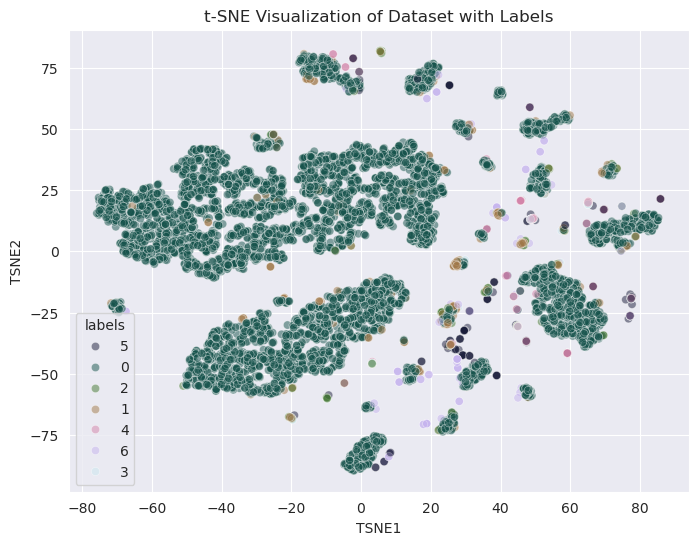

In [96]:
utils.plot_TSNE(df=None, 
                labels=tot_indices, 
                dist_matrix=gower.gower_matrix(preprocessing.load_dataset()))

In [45]:
utils.plot_3d_TSNE(df=None, 
                labels=lof_indices, 
                dist_matrix=gower.gower_matrix(preprocessing.load_dataset()))

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 7200 samples in 0.024s...
[t-SNE] Computed neighbors for 7200 samples in 0.500s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7200
[t-SNE] Computed conditional probabilities for sample 2000 / 7200
[t-SNE] Computed conditional probabilities for sample 3000 / 7200
[t-SNE] Computed conditional probabilities for sample 4000 / 7200
[t-SNE] Computed conditional probabilities for sample 5000 / 7200
[t-SNE] Computed conditional probabilities for sample 6000 / 7200
[t-SNE] Computed conditional probabilities for sample 7000 / 7200
[t-SNE] Computed conditional probabilities for sample 7200 / 7200
[t-SNE] Mean sigma: 0.003135
[t-SNE] KL divergence after 250 iterations with early exaggeration: 68.648956
[t-SNE] KL divergence after 1000 iterations: 0.839800


In [119]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE





In [20]:
pd.DataFrame(outl_probs).value_counts()

0.000000    6531
0.307196     240
1.241067     129
1.269919      88
0.692804      87
1.167783      76
1.000000      49
Name: count, dtype: int64

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 7200 samples in 0.024s...
[t-SNE] Computed neighbors for 7200 samples in 0.501s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7200
[t-SNE] Computed conditional probabilities for sample 2000 / 7200
[t-SNE] Computed conditional probabilities for sample 3000 / 7200
[t-SNE] Computed conditional probabilities for sample 4000 / 7200
[t-SNE] Computed conditional probabilities for sample 5000 / 7200
[t-SNE] Computed conditional probabilities for sample 6000 / 7200
[t-SNE] Computed conditional probabilities for sample 7000 / 7200
[t-SNE] Computed conditional probabilities for sample 7200 / 7200
[t-SNE] Mean sigma: 0.003135
[t-SNE] KL divergence after 250 iterations with early exaggeration: 69.396156
[t-SNE] KL divergence after 1000 iterations: 0.983156


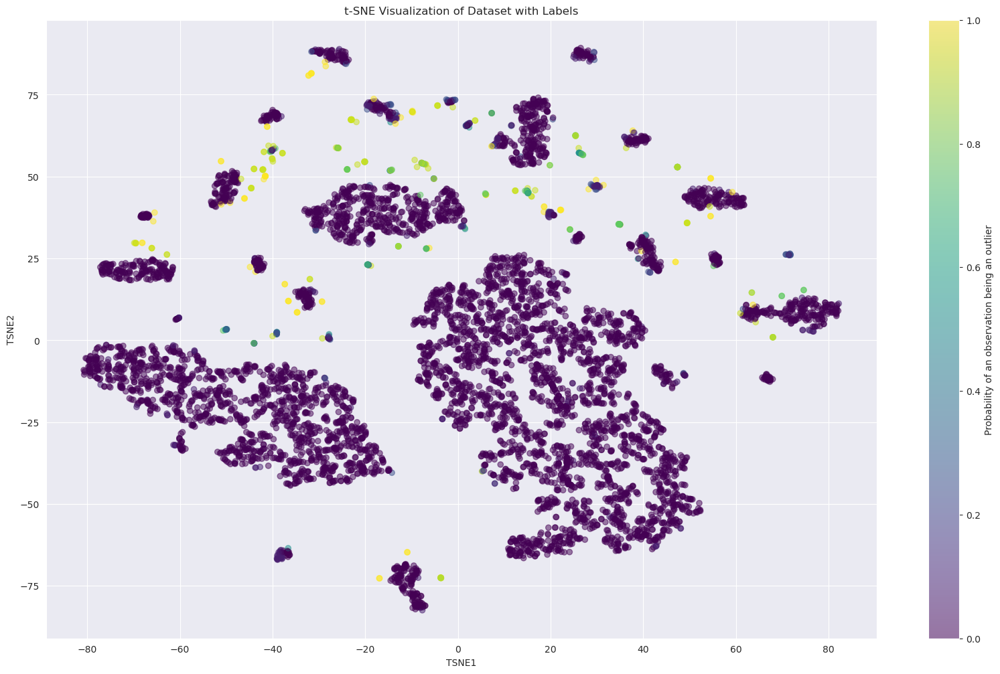

In [35]:
outl_probs = list(map(utils.sigmoid_to_prob(k=6), tot_indices))
outl_probs = list(map(lambda x: x/6, outl_probs))

utils.plot_TSNE_2(dist_matrix= gower.gower_matrix( preprocessing.load_dataset()), 
            labels=outl_probs)

In [38]:
np.save('results.npy', outl_probs)

In [121]:
utils.plot_3d_TSNE(df=None, 
                labels=tot_indices, 
                dist_matrix=gower.gower_matrix(preprocessing.load_dataset()))

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 7200 samples in 0.024s...
[t-SNE] Computed neighbors for 7200 samples in 0.523s...
[t-SNE] Computed conditional probabilities for sample 1000 / 7200
[t-SNE] Computed conditional probabilities for sample 2000 / 7200
[t-SNE] Computed conditional probabilities for sample 3000 / 7200
[t-SNE] Computed conditional probabilities for sample 4000 / 7200
[t-SNE] Computed conditional probabilities for sample 5000 / 7200
[t-SNE] Computed conditional probabilities for sample 6000 / 7200
[t-SNE] Computed conditional probabilities for sample 7000 / 7200
[t-SNE] Computed conditional probabilities for sample 7200 / 7200
[t-SNE] Mean sigma: 0.003135
[t-SNE] KL divergence after 250 iterations with early exaggeration: 68.755684
[t-SNE] KL divergence after 1000 iterations: 0.845530


In [11]:
def map_to_probabilities(x):
    a = 0.0962
    b = 1.5
    return a * (b ** x - 1)

In [14]:
pd.DataFrame(map_to_probabilities(tot_indices)).value_counts().sort_index()

NameError: name 'tot_indices' is not defined

In [114]:
def map_to_probabilities(x):
    a = 0.1
    b = 1.49
    return a * (b ** x - 1)

In [115]:
import pandas as pd

In [116]:
list(map(map_to_probabilities, [0,1,2,3,4,5,6]))

[0.0,
 0.049,
 0.12201000000000001,
 0.2307949,
 0.392884401,
 0.6343977574899999,
 0.9942526586601]

In [157]:
import numpy as np
from scipy.optimize import fsolve

def equations(vars):
    a, b = vars
    eq1 = a * (np.exp(b*(5)) - 1) - 0.9
    eq2 = a * (np.exp(b*(6)) - 1) - 1
    return [eq1, eq2]

# Initial guesses for a and b
initial_guess = [0.001, 1.5]
a, b = fsolve(equations, initial_guess)
a, b


(27.370256515032136, 0.00618772544547835)

In [160]:
def f (x):
    a, b = (27.370256515032136, 0.00618772544547835)
    return a * (np.exp(b*(x)) - 1)

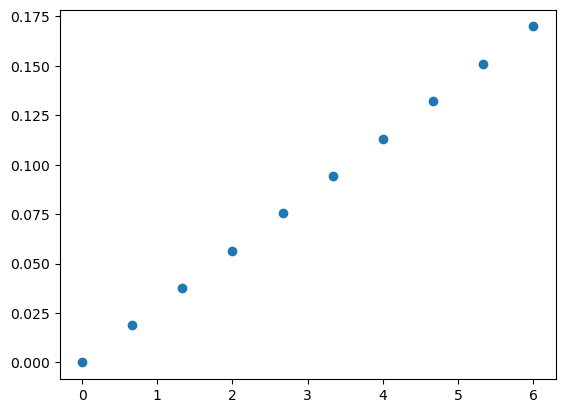

In [162]:
plt.scatter(np.linspace(0,6,10), [f(x) for x in np.linspace(0,1,10) ])

In [143]:
import matplotlib.pyplot as plt

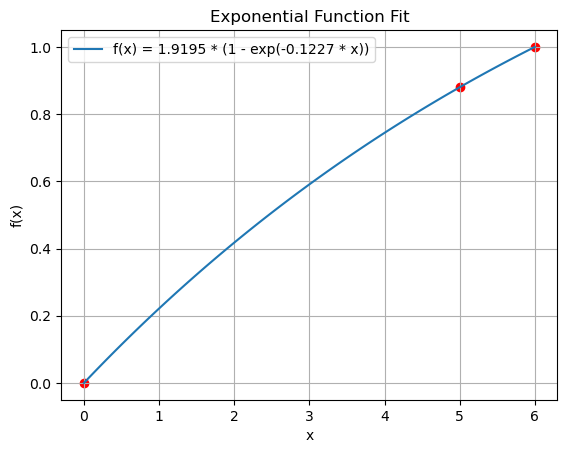

In [163]:
import matplotlib.pyplot as plt

x = np.linspace(0, 6, 100)
y = 1.9195021913537496 * (1 - np.exp(-0.12266478813860976 * x))

plt.plot(x, y, label='f(x) = 1.9195 * (1 - exp(-0.1227 * x))')
plt.scatter([0, 5, 6], [0, 0.88, 1], color='red')  # Plot the given points
plt.title('Exponential Function Fit')
plt.xlabel('x')
plt.ylabel('f(x)')
plt.legend()
plt.grid(True)
plt.show()